This colab explains how to generate depth and 3D structure from a single image. 

In [106]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

if IN_COLAB:
  #copy data
  !git clone https://github.com/mbaradad/pset_geometry
  !cp -rf pset_geometry/* .
  !rm -rf pset_geometry

# install dependencies, not provided by default
%pip install timm
%pip install kornia
! apt install exiftool

Cloning into 'pset_geometry'...
remote: Enumerating objects: 79, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 79 (delta 2), reused 30 (delta 2), pack-reused 46
Unpacking objects: 100% (79/79), done.
     |████████████████████████████████| 309 kB 7.3 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
Note, selecting 'libimage-exiftool-perl' instead of 'exiftool'
libimage-exiftool-perl is already the newest version (10.80-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [107]:
''' Code loading '''
from auxiliary_functions import *
import numpy as np
import cv2
import torch
import os
from subprocess import check_output
from kornia.geometry.depth import depth_to_3d

from IPython.display import Image, display

%matplotlib inline

First we will use MiDAS model described in: 

**Towards Robust Monocular Depth Estimation: Mixing Datasets for Zero-shot Cross-dataset Transfer**, René Ranftl, et al. (https://arxiv.org/abs/1907.01341) 

as implemented in: https://pytorch.org/hub/intelisl_midas_v2/

This model provides really good disparity for a lot of scenarios (as it was trained on multiple datasets), but it is up to an unknow constant disparity factor. As other depth networks, it is also up to scale. 

To recover a pointcloud we require camera parameters, which have to be known or estimated with another network.


The model we use for prediction is the large model from the previous paper (v2.1). There exists a newer model (v3) based on trasformers (DPT_large) that achieves higher accuracy. 

The architecture for v2.1 can be found here:
https://github.com/isl-org/MiDaS/blob/bbe0b1004be9ebe199b86c9575214402c6177b1b/midas/midas_net.py#L12

It consists of a ResNeXt-101 backbone (https://arxiv.org/abs/1611.05431) that produces features at different scales, and then these are aggregated through fusion blocks.

The next block loads the network, puts it in gpu and in eval mode, and then loads the transformations that have to be applied to the images before being fed to the network.

In [17]:
model_type = "MiDaS"  # MiDaS v2.1 - Large
midas = torch.hub.load("intel-isl/MiDaS", model_type)
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()
transform = midas_transforms.default_transform


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


We iterate and produce depths for all the block images:

In [42]:
data = 'data/blocks'
images = os.listdir(data)
predictions = []
loaded_imgs = []
for image in images:
  with torch.no_grad():
    img = cv2.imread('{}/{}'.format(data, image))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    input_batch = transform(img).to(device)

    prediction = midas(input_batch)

    prediction = torch.nn.functional.interpolate(
        prediction.unsqueeze(1),
        size=img.shape[:2],
        mode="bicubic",
        align_corners=False,
    ).squeeze()
  
  # save as a png for 
  loaded_imgs.append(img)
  predictions.append(prediction.cpu().numpy())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



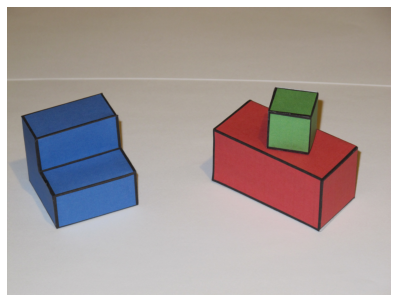

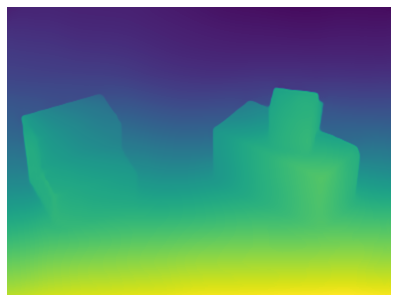

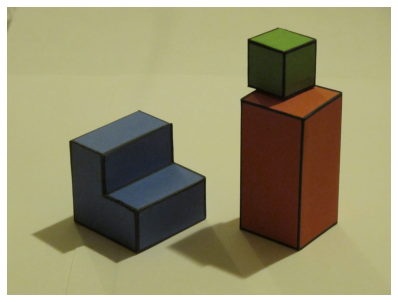

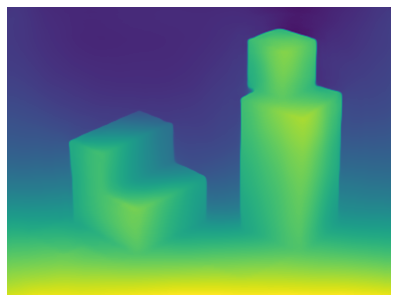

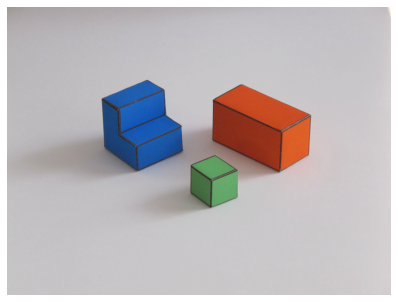

...

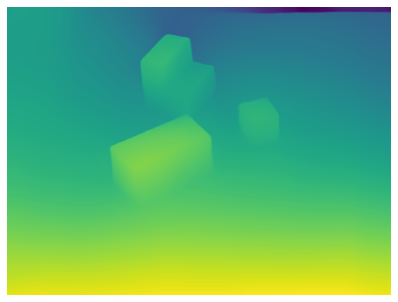

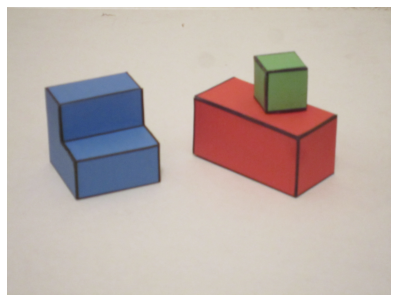

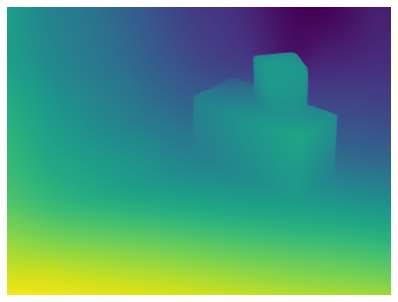

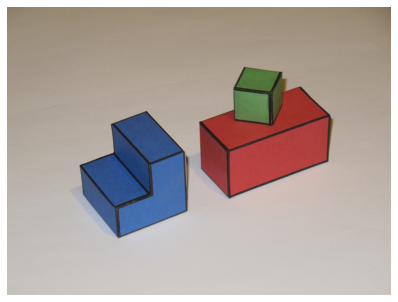

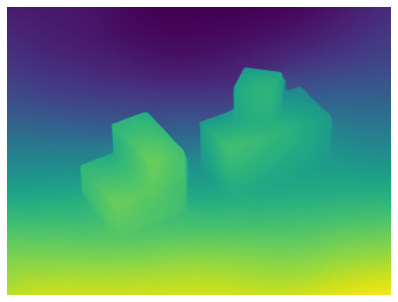

In [68]:
for i, (img, output) in enumerate(zip(loaded_imgs, predictions)):
  show_inline(img)
  show_inline(output)

To recover depth, we need to find (or manually fix by trial and error, as we do here) the constant disparity and then we can recover the depths up to scale as 1 / (disparity + ctt). In this case, we set it to 0.1.


In [102]:
depths = []
for disparity in predictions:
  disparity += 0.1
  depth = 1 / disparity
  depths.append(depth)

Once we have depth values, we need the focal length of the camera that took the picture to backproject the depth into a pointcloud. We obtain this using exiftool:
  

In [98]:
focal_length_ratios = []
for img_file in images:
  out = check_output('exiftool {}/{} | grep Focal | grep equivalent'.format(data, img_file), shell=True)
  equivalen_35mm_focal_length = float(str(out).split('equivalent: ')[-1].split(' mm')[0])
  focal_length_to_width_ratio = equivalen_35mm_focal_length / 35.0 
  focal_length_ratios.append(focal_length_to_width_ratio)

With this, we can obtain the pointcloud by backprojection.

In [115]:
pointclouds = []
for depth, f_ratio in zip(depths, focal_length_ratios):
  height, width = depth.shape
  assert width > height, "Image is probably rotated!"
  intrinsics = torch.FloatTensor(np.array(((width * f_ratio,   0,  width / 2),
                                  (0,  width * f_ratio, height / 2),
                                  (0,          0,                0))))


  depth = np.clip(depth, 0, np.quantile(depth, 0.95))
  pointclouds.append(depth_to_3d(torch.FloatTensor(depth[None,None,:,:]), intrinsics[None,...])[0])
  

And then display it (change it and re-execute the following cell to display a different pointcloud)

In [119]:
i = 1 
show_pointcloud(pointclouds[i], loaded_imgs[i].transpose((2,0,1)))

As can be seen in the previous example, the images where taken with a big zoom, and the newtork has not seen such examples in the training data. Fixing the focal length to a smaller zoom (which is more common in the training data) produces more peasing results:

In [121]:
pointclouds_manual = []
for depth, f_ratio in zip(depths, focal_length_ratios):
  height, width = depth.shape
  assert width > height, "Image is probably rotated!"
  intrinsics = torch.FloatTensor(np.array(((width,   0,  width / 2),
                                  (0,  width , height / 2),
                                  (0,          0,                0))))


  depth = np.clip(depth, 0, np.quantile(depth, 0.95))
  pointclouds_manual.append(depth_to_3d(torch.FloatTensor(depth[None,None,:,:]), intrinsics[None,...])[0])
  

In [122]:
i = 1 
show_pointcloud(pointclouds_manual[i], loaded_imgs[i].transpose((2,0,1)))